## Visualisations to be made:
### * = Done!
*Formation breakdown (horizontal bar chart/treemap)

*Sample formations (pass maps - also for analysing favourite/underdog matches)


### Style of play vizzes:
*Shot locations (does Bandovic's team tend to be patient on the ball or rely on long shots?)

*Goalkeeper's distribution (does Bandovic's team tend to distribute the ball long or short from goal kicks?)

*Passes into final third/penalty box (does Bandovic's team prefer to be direct or patient while in possession?)

*Corner deliveries (how effective is Bandovic's team from corner situations?)

*Anirudh Thapa/Ariel Borysiuk's touch/pass (who will be Hanoi's main playmaker?)

*Striker(s)'s touch map (does Bandovic prefer to have a target man or a fox in the box?)

*Attempted defensive actions locations (zone map) (does Bandovic's team prefer to press and win the ball high up the pitch or sit back in a mid/low block?)

*Possession won locations (where does Bandovic's team usually win the ball?)

In [37]:
# Import necessary libraries
from statsbombpy import sb
import pandas as pd
import squarify
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects
import matplotlib as mp
from mplsoccer import Pitch, VerticalPitch

mp.rcParams['figure.dpi'] = 700

### Data calling and processing

In [2]:
# Access Indian Super League's data from Statsbomb
isl_matches = sb.matches(competition_id = 1238, season_id = 108)

isl_matches

,match_id,match_date,kick_off,competition,season,home_team,away_team,home_score,away_score,match_status,...,last_updated_360,match_week,competition_stage,stadium,referee,home_managers,away_managers,data_version,shot_fidelity_version,xy_fidelity_version
0,3827767,2022-03-20,16:00:00.000,India - Indian Super league,2021/2022,Hyderabad,Kerala Blasters,1,1,available,...,None,25,Championship - Final,Pandit Jawaharlal Nehru Stadium,Crystal John,Manuel Márquez Roca,Ivan Vukomanović,1.1.0,2,2
1,3827335,2022-03-15,16:00:00.000,India - Indian Super league,2021/2022,Kerala Blasters,Jamshedpur,1,1,available,...,None,24,Play-offs - Semi-Finals,Tilak Maidan Stadium,Harish Kundu,Ivan Vukomanović,Owen Columba Coyle,1.1.0,2,2
2,3827336,2022-03-16,16:00:00.000,India - Indian Super league,2021/2022,ATK Mohun Bagan,Hyderabad,1,0,available,...,None,24,Play-offs - Semi-Finals,GMC Athletic Stadium,Ramachandran Venkatesh,Juan Ferrando Fenol,Manuel Márquez Roca,1.1.0,2,2
3,3827338,2022-03-12,16:00:00.000,India - Indian Super league,2021/2022,Hyderabad,ATK Mohun Bagan,3,1,available,...,None,23,Play-offs - Semi-Finals,GMC Athletic Stadium,Raul Gupta,Manuel Márquez Roca,Juan Ferrando Fenol,1.1.0,2,2
4,3827337,2022-03-11,16:00:00.000,India - Indian Super league,2021/2022,Jamshedpur,Kerala Blasters,0,1,available,...,None,23,Play-offs - Semi-Finals,Pandit Jawaharlal Nehru Stadium,Tejas Nagvenkar,Owen Columba Coyle,Ivan Vukomanović,1.1.0,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110,3813272,2021-12-18,18:00:00.000,India - Indian Super league,2021/2022,Goa,Hyderabad,1,1,available,...,None,7,Regular Season,GMC Athletic Stadium,Ramachandran Venkatesh,Juan Ferrando Fenol,Manuel Márquez Roca,1.1.0,2,2
111,3813268,2021-12-06,16:00:00.000,India - Indian Super league,2021/2022,Jamshedpur,ATK Mohun Bagan,2,1,available,...,None,4,Regular Season,GMC Athletic Stadium,Arumughan Rowan,Owen Columba Coyle,Antonio López Habas,1.1.0,2,2
112,3813267,2021-12-07,16:00:00.000,India - Indian Super league,2021/2022,East Bengal,Goa,3,4,available,...,None,5,Regular Season,Tilak Maidan Stadium,Coimbatore Ramaswamy Srikrishna,José Manuel Díaz Fernández,Juan Ferrando Fenol,1.1.0,2,2
113,3813265,2022-01-07,16:00:00.000,India - Indian Super league,2021/2022,East Bengal,Mumbai City,0,0,available,...,None,11,Regular Season,Tilak Maidan Stadium,Senthil Nathan,Mario Rivera Campesino,Des Buckingham,1.1.0,2,2


In [3]:
# Empty array to store Chennaiyin's matchIds
match_ids = isl_matches.loc[( (isl_matches["home_team"] == "Chennaiyin") | (isl_matches["away_team"] == "Chennaiyin") ) & ( (isl_matches["home_managers"] == "Božidar Bandović") | (isl_matches["away_managers"] == "Božidar Bandović") )]
matchIds_array = match_ids.match_id.to_list()

match_ids.sort_values('match_week', axis = 0)

,match_id,match_date,kick_off,competition,season,home_team,away_team,home_score,away_score,match_status,...,last_updated_360,match_week,competition_stage,stadium,referee,home_managers,away_managers,data_version,shot_fidelity_version,xy_fidelity_version
90,3813309,2021-11-23,16:00:00.000,India - Indian Super league,2021/2022,Hyderabad,Chennaiyin,0,1,available,...,None,1,Regular Season,GMC Athletic Stadium,Pranjal Banerji,Manuel Márquez Roca,Božidar Bandović,1.1.0,2,2
97,3813294,2021-11-29,16:00:00.000,India - Indian Super league,2021/2022,NorthEast United,Chennaiyin,1,2,available,...,None,3,Regular Season,Pandit Jawaharlal Nehru Stadium,Ashwin Mohanlal Kanojia,Khalid Ahmed Jamil,Božidar Bandović,1.1.0,2,2
106,3813280,2021-12-03,16:00:00.000,India - Indian Super league,2021/2022,Chennaiyin,East Bengal,0,0,available,...,None,4,Regular Season,Tilak Maidan Stadium,Crystal John,Božidar Bandović,José Manuel Díaz Fernández,1.1.0,2,2
81,3813281,2021-12-11,16:00:00.000,India - Indian Super league,2021/2022,ATK Mohun Bagan,Chennaiyin,1,1,available,...,None,5,Regular Season,Pandit Jawaharlal Nehru Stadium,Raul Gupta,Antonio López Habas,Božidar Bandović,1.1.0,2,2
104,3813286,2021-12-15,16:00:00.000,India - Indian Super league,2021/2022,Mumbai City,Chennaiyin,1,0,available,...,None,6,Regular Season,Pandit Jawaharlal Nehru Stadium,Arumughan Rowan,Des Buckingham,Božidar Bandović,1.1.0,2,2
80,3813279,2021-12-18,16:00:00.000,India - Indian Super league,2021/2022,Chennaiyin,Odisha,2,1,available,...,None,7,Regular Season,Tilak Maidan Stadium,Pratik Mondal,Božidar Bandović,Francisco Ramírez González,1.1.0,2,2
62,3813278,2021-12-22,16:00:00.000,India - Indian Super league,2021/2022,Chennaiyin,Kerala Blasters,0,3,available,...,None,8,Regular Season,Tilak Maidan Stadium,Crystal John,Božidar Bandović,Ivan Vukomanović,1.1.0,2,2
60,3813283,2021-12-30,16:00:00.000,India - Indian Super league,2021/2022,Chennaiyin,Bengaluru,2,4,available,...,None,9,Regular Season,Tilak Maidan Stadium,Raul Gupta,Božidar Bandović,Marco Pezzaiuoli,1.1.0,2,2
56,3813311,2022-01-02,18:00:00.000,India - Indian Super league,2021/2022,Jamshedpur,Chennaiyin,0,1,available,...,None,10,Regular Season,GMC Athletic Stadium,Pranjal Banerji,Owen Columba Coyle,Božidar Bandović,1.1.0,2,2
54,3813266,2022-01-08,18:00:00.000,India - Indian Super league,2021/2022,Goa,Chennaiyin,1,0,available,...,None,11,Regular Season,GMC Athletic Stadium,Pratik Mondal,Derrick Pereira,Božidar Bandović,1.1.0,2,2


### Formation breakdown viz

In [4]:
# Empty array to store all starting lineups
starting_lineups = []

# Call all events file using match IDs stored in matchIds_array,
# access all of Chennaiyin's formations, and store in the empty array
for matchId in matchIds_array:

    formation = 0

    events = sb.events(match_id = matchId)
    formation = events.loc[(events['type'] == 'Starting XI') & (events['team'] == 'Chennaiyin')].reset_index().tactics[0]['formation']

    starting_lineups.append(formation)

In [5]:
# Turn starting_lineups -> two numpy arrays -> turn back to Python lists?
XI_unique, XI_counts = np.unique(starting_lineups, return_counts = True)

XI_unique = XI_unique.tolist()
XI_counts = XI_counts.tolist()

# Replace integers in XI_unique with formation strings
XI_unique[0] = '3-5-2'
XI_unique[1] = '4-1-4-1'
XI_unique[2] = '4-2-3-1'

Text(0.13, 0.05, 'Data by Statsbomb\nBy Daryl - @dgouilard')

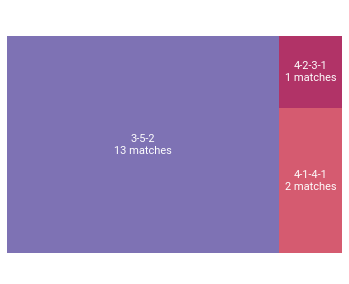

In [6]:
# Set up treemap plot using Squarify and Matplotlib
plt.style.use('dark_background')

labels = [f'{formation}\n{count} matches' for formation, count in zip(XI_unique, XI_counts)] # Set up labels for the plot
norm = mp.colors.Normalize(vmin=min(XI_counts), vmax=max(XI_counts)) # Normalise colormap based on XI_counts values
colors = [mp.cm.Spectral(norm(value)) for value in XI_counts] # Set up colormap
# Plot treemap using Squarify
squarify.plot(sizes = XI_counts, label = labels, alpha = .8, color = colors, text_kwargs = {"fontsize": 11, "fontfamily": 'Roboto', "color": 'white'})
plt.axis('off') # Turn both axes off

# Add title and endnote
plt.suptitle(x = 0.52, y = 0.98, t = "Chennaiyin | Formation breakdown | ISL 2021/22\nData is calculated after 16 matches", fontfamily = 'Roboto', ha = 'center', fontweight = 'bold')
plt.figtext(x = 0.13, y = 0.05, s = "Data by Statsbomb\nBy Daryl - @dgouilard", fontdict = {"fontfamily": 'Roboto', "fontsize": 7, "fontweight": 'bold'})

### Passing network

In [7]:
# Get the players' details from each match
lineup = sb.lineups(match_id = matchIds_array[0])['Chennaiyin']
row_labels = [0] # Row labels for converting players_data dict to DataFrame
# Empty dict to store player's details
players_data = {
    'Name': '',
    'Position ID': 0,
    'Position': '',
    'ID': ''
}
players_data = pd.DataFrame(players_data, row_labels) # Convert dict to DataFrame for concatenating
playerDetails = pd.DataFrame() # Empty DataFrame to store players' details

# Access the lineup array
for i in range(len(lineup) - 1):
    # If the player played in the match (aka positions != empty)
    if (lineup['positions'][i] != []):
        
        # If the player starts the match
        # then add all info to df players_data
        if (lineup['positions'][i][0]['start_reason'] == 'Starting XI'):
            players_data['Name'] = lineup['player_name'][i]
            players_data['ID'] = lineup['player_id'][i]
            players_data['Position'] = lineup['positions'][i][0]['position']
            players_data['Position ID'] = lineup['positions'][i][0]['position_id']

            # Concatenate (append) players_data and playerDetails to add details from one df to the other
            playerDetails = pd.concat([players_data, playerDetails], ignore_index = True)

# Sort playerDetails by Statsbomb's position ID
playerDetails = playerDetails.sort_values("Position ID", axis = 0).reset_index(drop = True)
playerDetails

,Name,Position ID,Position,ID
0,Debjit Majumder,1,Goalkeeper,164480
1,Deepak Devrani,3,Right Center Back,164497
2,Slavko Damjanović,4,Center Back,89499
3,Narayan Das,5,Left Center Back,164481
4,Khumanthem Ninthoinganba Meetei,7,Right Wing Back,164479
5,Jerry Lalrinzuala,8,Left Wing Back,164496
6,Ariel Borysiuk,10,Center Defensive Midfield,8202
7,Germanpreet Singh,13,Right Center Midfield,167009
8,Anirudh Thapa,15,Left Center Midfield,124759
9,Łukasz Gikiewicz,22,Right Center Forward,164476


In [8]:
# Get all pass events from each match
all_events = sb.events(match_id = matchIds_array[0])
# Sort all_events by period, minute, and second
all_events = all_events.sort_values(by = ['period', 'minute', 'second']).reset_index(drop = True).fillna(0)

In [9]:
# Get only successful Pass events and Substitution events
all_passes = all_events.loc[(all_events['team'] == 'Chennaiyin') & ( (all_events['type'] == 'Pass') | (all_events['type'] == 'Substitution') ) & \
    ( (all_events['pass_outcome'] != 'Incomplete') | (all_events['pass_outcome'] != 'Injury Clearance') | (all_events['pass_outcome'] != 'Out') | \
        (all_events['pass_outcome'] != 'Pass Offside') | (all_events['pass_outcome'] != 'Unknown') )].reset_index(drop = True)

# Create empty DataFrame to create a pass matrix
passingNetwork = pd.DataFrame()

# Get the index of the first Substitution event
firstSubIndex = all_passes.loc[(all_passes['type'] == 'Substitution')].index.to_list()[0]

# Loop through all starting players
for player in playerDetails['Name']:

    # Create an empty dict to store the pass combinations
    passes_FromTo = {
        'Name': '',
        'Successful passes': 0,
        playerDetails['Name'][0]: 0,
        playerDetails['Name'][1]: 0,
        playerDetails['Name'][2]: 0,
        playerDetails['Name'][3]: 0,
        playerDetails['Name'][4]: 0,
        playerDetails['Name'][5]: 0,
        playerDetails['Name'][6]: 0,
        playerDetails['Name'][7]: 0,
        playerDetails['Name'][8]: 0,
        playerDetails['Name'][9]: 0,
        playerDetails['Name'][10]: 0
    }
    # Convert empty dict into DataFrame for concatenating later on
    passes_FromTo = pd.DataFrame(passes_FromTo, row_labels)

    # Gather all passes made by player and with a recipient
    player_passes = all_passes.loc[(all_passes['player'] == player) & (all_passes['pass_recipient'] != 0)].reset_index()
    successful_passes = all_passes.loc[(all_passes['player'] == player)].reset_index()
    # Get all passes before the first substitution
    player_passes = player_passes.loc[(player_passes['level_0'] < firstSubIndex)].reset_index(drop = True)
    successful_passes = successful_passes.loc[(successful_passes['level_0'] < firstSubIndex)].reset_index(drop = True)
    
    # Add the name of the passer and total successful passes to dict passes_FromTo
    passes_FromTo['Name'] = player
    passes_FromTo['Successful passes'] = len(successful_passes)

    # Loop through all passes made by the player
    for i in range(len(player_passes)):

        # Empty variable to store the number of passes made and successful passes
        passCount = 0

        # Check if the recipient is in the starting lineup or not
        isStartingXI = False
        for y in range(len(playerDetails)):
            if (player_passes['pass_recipient'][i] == playerDetails['Name'][y]):
                isStartingXI = True
                break
        
        # If the recipient is in the starting lineup
        # then add one to passCount and add to dict passes_FromTo
        if (isStartingXI == True):
            passCount = passes_FromTo[player_passes['pass_recipient'][i]][0]
            passes_FromTo.loc[0, player_passes['pass_recipient'][i]] = passCount + 1

    # Concatenate (append) passes_FromTo and passingNetwork to add pass counts to the total pass matrix
    passingNetwork = pd.concat([passes_FromTo, passingNetwork], ignore_index = True)

# Merge playerDetails and passingNetwork using Name column
passingNetwork = playerDetails.merge(passingNetwork, on = 'Name', sort = 'Position ID')
# Sort passingNetwork based on Position ID
passingNetwork = passingNetwork.sort_values('Position ID', axis = 0).reset_index(drop = True).set_index("Position ID").reset_index(drop = True)

In [10]:
passingNetwork

,Name,Position,ID,Successful passes,Debjit Majumder,Deepak Devrani,Slavko Damjanović,Narayan Das,Khumanthem Ninthoinganba Meetei,Jerry Lalrinzuala,Ariel Borysiuk,Germanpreet Singh,Anirudh Thapa,Łukasz Gikiewicz,Mirlan Murzaev
0,Debjit Majumder,Goalkeeper,164480,17,0,2,5,0,1,1,1,1,0,1,4
1,Deepak Devrani,Right Center Back,164497,27,3,0,2,1,5,0,3,0,3,5,1
2,Slavko Damjanović,Center Back,89499,20,4,4,0,1,1,1,3,0,3,1,0
3,Narayan Das,Left Center Back,164481,26,1,2,3,0,0,8,3,0,0,2,5
4,Khumanthem Ninthoinganba Meetei,Right Wing Back,164479,22,1,4,0,0,0,0,3,2,3,4,3
5,Jerry Lalrinzuala,Left Wing Back,164496,23,0,0,2,10,0,0,0,3,4,0,4
6,Ariel Borysiuk,Center Defensive Midfield,8202,26,0,3,1,5,5,1,0,1,2,2,2
7,Germanpreet Singh,Right Center Midfield,167009,9,0,0,0,0,2,3,0,0,0,1,1
8,Anirudh Thapa,Left Center Midfield,124759,23,1,0,1,3,5,3,6,0,0,2,1
9,Łukasz Gikiewicz,Right Center Forward,164476,13,0,0,0,1,0,1,3,2,2,0,2


In [11]:
# Get all on-ball events
events_modified = all_events.loc[(all_events['team'] == 'Chennaiyin') & ( (all_events['type'] != 'Starting XI') & (all_events['type'] != 'Camera On*') & \
    (all_events['type'] != 'Half Start') & (all_events['type'] != 'Substitution') & (all_events['type'] != 'Player On') & (all_events['type'] != 'Player Off') & \
        (all_events['type'] != 'Tactical Shift') & (all_events['type'] != 'Injury Stoppage') & (all_events['type'] != 'Referee Ball-Drop') & \
            (all_events['type'] != 'Half End') & (all_events['type'] != 'Bad Behaviour')) & (all_events['location'] != 0)].reset_index(drop = True)

# Empty DataFrame to store average positions
avgPositions = pd.DataFrame()

# Loop through all starting players
for player in playerDetails['Name']:

    average_coordinates = {
        'Name': '',
        'X': 0,
        'Y': 0
    }

    # Convert empty dict into DataFrame for concatenating later on
    average_coordinates = pd.DataFrame(average_coordinates, row_labels)

    # Get all events made by player
    player_events = events_modified.loc[(events_modified['player'] == player)].reset_index(drop = True)
    
    # Add the name of the player to dict average_coordinates
    average_coordinates['Name'] = player

    # Empty variables to store the total and average x and y coordinates
    total_x = 0
    total_y = 0
    average_x = 0
    average_y = 0

    # Calculate the total x and y coordinates from all player's events
    for i in range(len(player_events)):
        total_x = total_x + player_events['location'][i][0]
        total_y = total_y + player_events['location'][i][1]

    # Divide by the number of player's events (aka len(player_events))
    # to get the average x and y coordinates
    average_x = round(total_x / len(player_events), 1)
    average_y = round(total_y / len(player_events), 1)

    # Add the average coordinates into the dict
    average_coordinates['X'] = average_x
    average_coordinates['Y'] = average_y

    # Concatenate (append) average_coordinates and avgPositions to add the average coordinates to the DataFrame
    avgPositions = pd.concat([average_coordinates, avgPositions], ignore_index = True)

# Merge playerDetails and avgPositions using Name column
avgPositions = playerDetails.merge(avgPositions, on = 'Name', sort = 'Position ID')
# Sort avgPositions based on Position ID
avgPositions = avgPositions.sort_values('Position ID', axis = 0).reset_index(drop = True).set_index("Position ID").reset_index(drop = True)

In [12]:
avgPositions

,Name,Position,ID,X,Y
0,Debjit Majumder,Goalkeeper,164480,8.6,40.5
1,Deepak Devrani,Right Center Back,164497,41.6,59.1
2,Slavko Damjanović,Center Back,89499,35.0,30.4
3,Narayan Das,Left Center Back,164481,38.3,14.7
4,Khumanthem Ninthoinganba Meetei,Right Wing Back,164479,66.6,69.0
5,Jerry Lalrinzuala,Left Wing Back,164496,52.6,6.9
6,Ariel Borysiuk,Center Defensive Midfield,8202,49.1,44.8
7,Germanpreet Singh,Right Center Midfield,167009,66.5,50.5
8,Anirudh Thapa,Left Center Midfield,124759,62.0,39.1
9,Łukasz Gikiewicz,Right Center Forward,164476,66.5,46.0


In [13]:
# Chennaiyin colours
home_colour = '#FDB813'
home_edge_colour = '#1B4794'

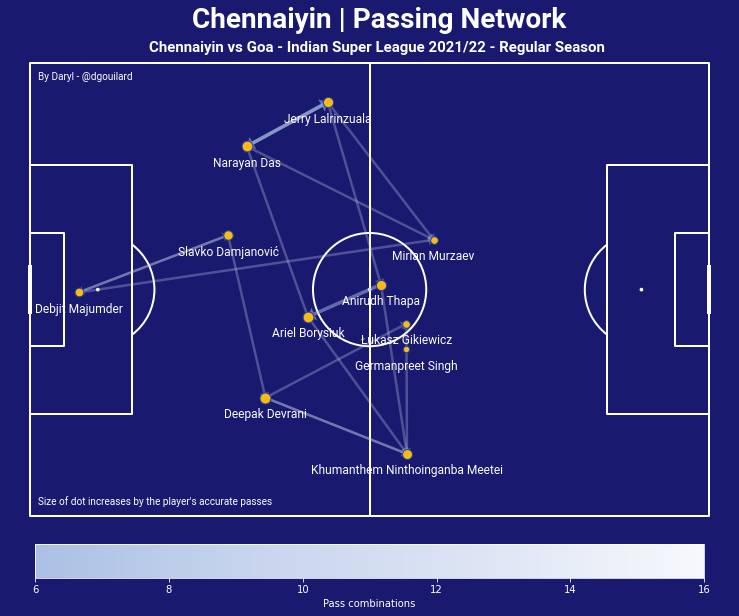

In [14]:
# Set up the pitch using Pitch module from mplsoccer
# and draw the pitch
pitch = Pitch(pitch_type = 'statsbomb', pitch_color = 'midnightblue', line_color = 'white', stripe = False)
fig, ax = pitch.draw(figsize = (10, 8))

receivers = passingNetwork.columns.to_list()[4:]

# Loop through all rows of passingNetwork
for i in range(len(passingNetwork)):

    # Empty variables to store x and y coordinates
    # start = passer; end = receiver
    x_start = 0
    x_end = 0
    y_start = 0
    y_end = 0

    # Get the name of the passer
    ballPasser = passingNetwork['Name'][i]

    # Get the name of the receiver from receivers array
    for ballReceiver in receivers:
        
        # Get the number of pass combinations
        passValue = passingNetwork[ballReceiver][i]

        # Find the average position of the passer and receiver
        for y in range(len(avgPositions)):
            if ballPasser == avgPositions['Name'][y]:
                x_start = avgPositions['X'][y]
                y_start = avgPositions['Y'][y]
            if ballReceiver == avgPositions['Name'][y]:
                x_end = avgPositions['X'][y]
                y_end = avgPositions['Y'][y]

        # Draw pass arrows based on the number of pass combos
        if passValue < 4:
            # arrow = pitch.arrows(x_start, y_start, x_end, y_end, width = 1.5, headwidth = 1, headlength = 1, color = '#32527b', alpha = 0.1, ax = ax)
            continue
        elif passValue < 6:
            arrow = pitch.arrows(x_start, y_start, x_end, y_end, width = 2.5, headwidth = 4, headlength = 2, headaxislength = 2, 
                                    color = '#c7d5ed', alpha = 0.3, ax = ax)
        elif passValue < 12:
            arrow = pitch.arrows(x_start, y_start, x_end, y_end, width = 3.5, headwidth = 4, headlength = 2, headaxislength = 2, 
                                    color = '#abc0e4', alpha = 0.5, ax = ax)
        elif passValue < 16:
            arrow = pitch.arrows(x_start, y_start, x_end, y_end, width = 4.5, headwidth = 4, headlength = 2, headaxislength = 2, 
                                    color = '#dde5f4', alpha = 0.65, ax = ax)
        else:
            arrow = pitch.arrows(x_start, y_start, x_end, y_end, width = 5.5, headwidth = 4, headlength = 2, headaxislength = 2, 
                                    color = '#f6f8fc', alpha = 0.85, ax = ax)

# Add player names on the pass network
for i in range(len(avgPositions)):
    nodes = pitch.scatter(avgPositions['X'][i], avgPositions['Y'][i], s = 4.5 * passingNetwork['Successful passes'][i], 
                            color = home_colour, edgecolors = home_edge_colour, zorder = 1, ax = ax)
    playerInfo = avgPositions['Name'][i]
    playerPosition = (avgPositions['X'][i], avgPositions['Y'][i])
    text = pitch.annotate(playerInfo, playerPosition, (avgPositions['X'][i], avgPositions['Y'][i] + 3), 
                            ha = 'center', va = 'center', fontfamily = 'roboto', fontsize = 12, color = 'white', ax = ax)

# Set up colormap for arrows
cmap0 = mp.colors.LinearSegmentedColormap.from_list(
        'White2Blue', ['#abc0e4', '#c8d5ed', '#dde5f4', '#f6f8fc'])
norm = mp.colors.Normalize(vmin = 6, vmax=16)

# Set up colorbar
cbar = ax.figure.colorbar(
            mp.cm.ScalarMappable(norm = norm, cmap = cmap0),
            ax=ax, location = 'bottom', orientation = 'horizontal', fraction = .06, pad = .01)
cbar.ax.tick_params(color = "white", labelcolor = "white")
cbar.set_label('Pass combinations', color = 'white')

# Add texts to the passing network
ax.text(1.5, 78, "Size of dot increases by the player's accurate passes",
                color = 'white', fontsize = 10, ha = 'left', fontfamily = 'roboto')

# Titles and endnotes
plt.suptitle(x = 0.51, y = 0.945, t = 'Chennaiyin' + ' | Passing Network', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 28, ha = 'center')
ax.set_title(x = 0.51, y = 0.965, label = 'Chennaiyin vs Goa' + " - " + 'Indian Super League 2021/22' + " - " + 'Regular Season', 
        color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 15, ha = 'center')
ax.text(1.5, 3, "By Daryl - @dgouilard", color = 'white', fontfamily = 'roboto', fontsize = 10)

# Set the facecolor, width, and height of the figure
fig.set_facecolor('midnightblue')
fig.set_figwidth(10.5)
fig.set_figheight(9)

### Style of play vizzes

Shot locations

In [15]:
# Get all events from Statsbomb
comp_events = sb.competition_events(
    country = 'India',
    division = 'Indian Super league',
    season = '2021/2022',
    gender = 'male'
)

In [16]:
# Filter out events that do not belong to Chennaiyin and not on-ball events
chennaiyin_events = comp_events.loc[(comp_events['team'] == 'Chennaiyin') & ( (comp_events['type'] != 'Starting XI') & (comp_events['type'] != 'Camera On*') & \
    (comp_events['type'] != 'Half Start') & (comp_events['type'] != 'Substitution') & (comp_events['type'] != 'Player On') & (comp_events['type'] != 'Player Off') & \
        (comp_events['type'] != 'Tactical Shift') & (comp_events['type'] != 'Injury Stoppage') & (comp_events['type'] != 'Referee Ball-Drop') & \
            (comp_events['type'] != 'Half End') & (comp_events['type'] != 'Bad Behaviour')) & (comp_events['location'] != 0) & \
                (comp_events['match_id'].isin(matchIds_array))].reset_index(drop = True).fillna(0)
chennaiyin_events

,50_50,bad_behaviour_card,ball_receipt_outcome,ball_recovery_offensive,ball_recovery_recovery_failure,block_deflection,block_offensive,block_save_block,carry_end_location,clearance_aerial_won,...,shot_statsbomb_xg,shot_technique,shot_type,substitution_outcome,substitution_replacement,tactics,team,timestamp,type,under_pressure
0,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,0,0,0,Chennaiyin,00:00:00.908,Pass,0
1,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,0,0,0,Chennaiyin,00:00:02.652,Pass,0
2,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,0,0,0,Chennaiyin,00:00:05.897,Pass,0
3,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,0,0,0,Chennaiyin,00:00:08.312,Pass,0
4,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,0,0,0,Chennaiyin,00:00:14.947,Pass,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23190,"{'outcome': {'id': 2, 'name': 'Success To Oppo...",0,0,0,0,0,0,0,0,0,...,0.0,0,0,0,0,0,Chennaiyin,00:45:23.333,50/50,True
23191,"{'outcome': {'id': 1, 'name': 'Lost'}}",0,0,0,0,0,0,0,0,0,...,0.0,0,0,0,0,0,Chennaiyin,00:11:24.276,50/50,True
23192,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,0,0,0,Chennaiyin,00:45:43.662,Own Goal Against,0
23193,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,0,0,0,Chennaiyin,00:04:05.440,Own Goal Against,0


In [17]:
# Get all shot events
all_shots = chennaiyin_events.loc[(chennaiyin_events['type'] == 'Shot') & (chennaiyin_events['shot_type'] != 'Penalty')].reset_index(drop = True)
all_shots.head()

,50_50,bad_behaviour_card,ball_receipt_outcome,ball_recovery_offensive,ball_recovery_recovery_failure,block_deflection,block_offensive,block_save_block,carry_end_location,clearance_aerial_won,...,shot_statsbomb_xg,shot_technique,shot_type,substitution_outcome,substitution_replacement,tactics,team,timestamp,type,under_pressure
0,0,0,0,0,0,0,0,0,0,0,...,0.017567,Half Volley,Open Play,0,0,0,Chennaiyin,00:02:17.076,Shot,0
1,0,0,0,0,0,0,0,0,0,0,...,0.026035,Normal,Free Kick,0,0,0,Chennaiyin,00:19:35.225,Shot,0
2,0,0,0,0,0,0,0,0,0,0,...,0.047383,Normal,Open Play,0,0,0,Chennaiyin,00:21:28.196,Shot,0
3,0,0,0,0,0,0,0,0,0,0,...,0.266932,Half Volley,Open Play,0,0,0,Chennaiyin,00:30:44.792,Shot,0
4,0,0,0,0,0,0,0,0,0,0,...,0.011622,Normal,Open Play,0,0,0,Chennaiyin,00:35:22.275,Shot,0


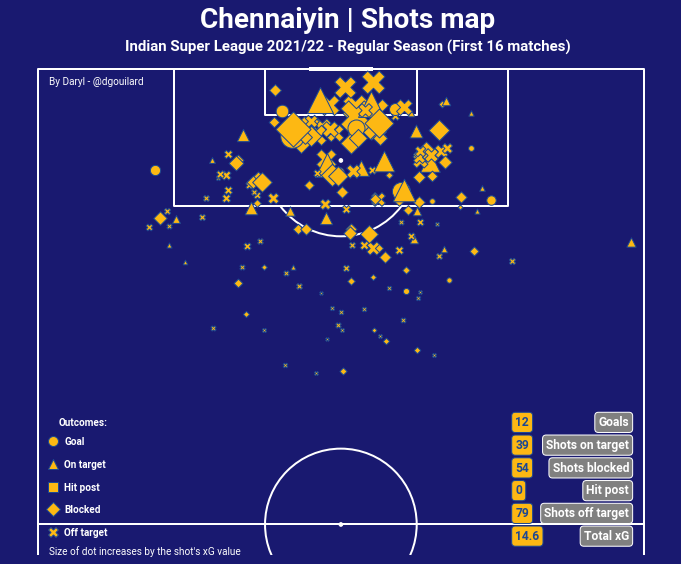

In [18]:
# Empty variables to store different shot types
goals = 0
on_target = 0
blocked_shots = 0
post = 0
off_target = 0
total_xg = 0

# Set up and draw vertical, half pitch
pitch = VerticalPitch(pitch_type = 'statsbomb', pitch_color = 'midnightblue', line_color = 'white', half = True)
fig, ax = pitch.draw(figsize = (10, 8))

# Loop through all_shots df to find all shot events
for i in range(0, len(all_shots)):

    # If the shot ends up as a goal
    if (all_shots['shot_outcome'][i] == 'Goal'):
        # Plot the shot
        nodes = pitch.scatter(all_shots['location'][i][0], all_shots['location'][i][1], s = 1500 * all_shots['shot_statsbomb_xg'][i], marker = 'o',
                            color = home_colour, edgecolors = home_edge_colour, zorder = 1, ax = ax)
        goals += 1 # Increment goal count up by 1
        on_target += 1 # Increment shot on target count by 1

    # If the shot is on target or saved by the keeper
    elif (all_shots['shot_outcome'][i] == 'Saved'):
        # Plot the shot
        nodes = pitch.scatter(all_shots['location'][i][0], all_shots['location'][i][1], s = 1500 * all_shots['shot_statsbomb_xg'][i], marker = '^',
                            color = home_colour, edgecolors = home_edge_colour, zorder = 1, ax = ax)
        on_target += 1 # Increment shot on target count by 1

    # If the shot is blocked
    elif (all_shots['shot_outcome'][i] == 'Blocked'):
        # Plot the shot
        nodes = pitch.scatter(all_shots['location'][i][0], all_shots['location'][i][1], s = 1500 * all_shots['shot_statsbomb_xg'][i], marker = 'D',
                            color = home_colour, edgecolors = home_edge_colour, zorder = 1, ax = ax)
        blocked_shots += 1 # Increment blocked shot count by 1

    # If the shot hits the post or is saved to the post
    elif (all_shots['shot_outcome'][i] == 'Post') | (all_shots['shot_outcome'][i] == 'Saved To Post'):
        # Plot the shot
        nodes = pitch.scatter(all_shots['location'][i][0], all_shots['location'][i][1], s = 1500 * all_shots['shot_statsbomb_xg'][i], marker = 's',
                            color = home_colour, edgecolors = home_edge_colour, zorder = 1, ax = ax)
        post += 1 # Increment post shot count by 1
    
    # If the shot is off target/wayward, or saved but is off target
    else:
        # Plot the shot
        nodes = pitch.scatter(all_shots['location'][i][0], all_shots['location'][i][1], s = 1500 * all_shots['shot_statsbomb_xg'][i], marker = 'X',
                            color = home_colour, edgecolors = home_edge_colour, zorder = 1, ax = ax)
        off_target += 1 # Increment shot off target count by 1
    
    # Add the xG of the shot to the total xG count
    total_xg = total_xg + all_shots['shot_statsbomb_xg'][i]

# Write credit and note
ax.text(1.5, 118, "By Daryl - @dgouilard", color = 'white', fontfamily = 'roboto', fontsize = 10)
ax.text(1.5, 56, "Size of dot increases by the shot's xG value", 
        color = 'white', fontfamily = 'roboto', fontsize = 10)

# Set up text boxes and font dict
text_box = dict(boxstyle = 'round', facecolor = 'grey', edgecolor = 'white')
home_values = dict(boxstyle='round', facecolor = home_colour,
                     edgecolor = home_edge_colour)

# Display the total shot type counts
ax.text(78, 73, 'Goals', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'right', bbox  = text_box)
ax.text(63, 73, str(goals), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(78, 70, 'Shots on target', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'right', bbox  = text_box)
ax.text(63, 70, str(on_target), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(78, 67, 'Shots blocked', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'right', bbox  = text_box)
ax.text(63, 67, str(blocked_shots), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(78, 64, 'Hit post', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'right', bbox  = text_box)
ax.text(63, 64, str(post), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(78, 61, 'Shots off target', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'right', bbox  = text_box)
ax.text(63, 61, str(off_target), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(78, 58, 'Total xG', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'right', bbox  = text_box)
ax.text(63, 58, str(round(total_xg, 2)), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

# Display the annotation marks for each shot type
ax.text(6, 73, 'Outcomes:', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 10, ha = 'center')
nodes = pitch.scatter(71, 2, s = 100, marker = 'o',
                        color = home_colour, edgecolors = home_edge_colour, zorder = 1, ax = ax)
ax.text(3.5, 70.5, 'Goal', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 10, ha = 'left')
nodes = pitch.scatter(68, 2, s = 100, marker = '^',
                                color = home_colour, edgecolors = home_edge_colour, zorder = 1, ax = ax)
ax.text(3.5, 67.5, 'On target', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 10, ha = 'left')
nodes = pitch.scatter(65, 2, s = 100, marker = 's',
                        color = home_colour, edgecolors = home_edge_colour, zorder = 1, ax = ax)
ax.text(3.5, 64.5, 'Hit post', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 10, ha = 'left')
nodes = pitch.scatter(62, 2, s = 100, marker = 'D',
                                color = home_colour, edgecolors = home_edge_colour, zorder = 1, ax = ax)
ax.text(3.5, 61.5, 'Blocked', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 10, ha = 'left')
nodes = pitch.scatter(59, 2, s = 100, marker = 'X',
                        color = home_colour, edgecolors = home_edge_colour, zorder = 1, ax = ax)
ax.text(3.5, 58.5, 'Off target', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 10, ha = 'left')

# Set title and subtitle
plt.suptitle(x = 0.51, y = 0.97, t = 'Chennaiyin' + ' | Shots map', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 28, ha = 'center')
ax.set_title(x = 0.51, y = 0.965, label = 'Indian Super League 2021/22' + " - " + 'Regular Season (First 16 matches)', 
        color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 15, ha = 'center')

# Set background colour and width of fig
fig.set_facecolor('midnightblue')

### Pass events-related vizzes

Goalkeeper's distribution

In [19]:
# Get all pass events from comp_events
pass_events = chennaiyin_events.loc[(chennaiyin_events['type'] == 'Pass') & \
    ( (chennaiyin_events['pass_outcome'] != 'Unknown') & (chennaiyin_events['pass_outcome'] != 'Injury Clearance') )].reset_index(drop = True)

In [20]:
# Get all pass events from goal kicks
goalkeeper_passes = pass_events.loc[( (pass_events['player'] == 'Debjit Majumder') | (pass_events['player'] == 'Vishal Kaith') | \
     (pass_events['player'] == 'Samik Mitra'))].reset_index(drop = True)

goalkeeper_passes['player']

0      Debjit Majumder
1      Debjit Majumder
2      Debjit Majumder
3      Debjit Majumder
4      Debjit Majumder
            ...       
442       Vishal Kaith
443       Vishal Kaith
444       Vishal Kaith
445       Vishal Kaith
446       Vishal Kaith
Name: player, Length: 447, dtype: object

In [21]:
# Two empty arrays to store the x and y end coordinates
x_coordinates = []
y_coordinates = []

# Loop through goalkeeper_passes df to get all coordinates
for i in range(len(goalkeeper_passes)):
    x_coordinates.append(goalkeeper_passes['pass_end_location'][i][0])
    y_coordinates.append(goalkeeper_passes['pass_end_location'][i][1])

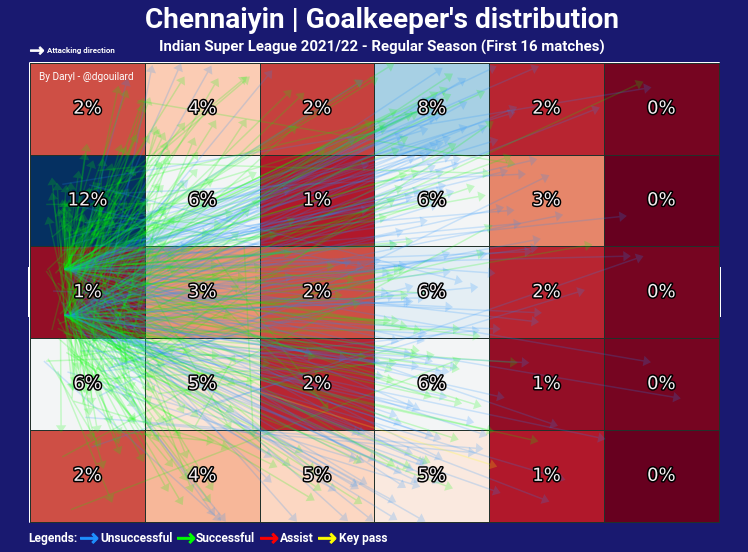

In [22]:
# Set up and draw the pitch
pitch = Pitch(pitch_type = 'statsbomb', pitch_color = 'midnightblue', 
              line_color = "white", stripe = False)
fig, ax = pitch.draw(figsize = (10, 8))

# Empty variables to store the total count of each pass type
successful_passes = 0
unsuccessful_passes = 0
assists = 0
key_passes = 0

# Path effects for zone maps
path_eff = [path_effects.Stroke(linewidth=3, foreground='black'),
            path_effects.Normal()]

# Heatmap and labels for zone maps
bin_statistic = pitch.bin_statistic(x_coordinates, y_coordinates, statistic = 'count',
                                    bins = (6, 5), normalize = True)
pitch.heatmap(bin_statistic, ax = ax,
                cmap = 'RdBu', edgecolors = '#22312b')
labels = pitch.label_heatmap(bin_statistic, color = '#f4edf0', fontsize = 18,
                             ax = ax, ha = 'center', va = 'center',
                             str_format = '{:.0%}', path_effects = path_eff)

# Loop through all passes in goalkeeper_passes
for i in range(len(goalkeeper_passes)):
    
    # If pass_outcome does not contain any specific value
    # (aka pass is successful)
    if (goalkeeper_passes['pass_outcome'][i] == 0):
        
        # If goal_assist is set to True
        # (aka pass assists a goal)
        if (goalkeeper_passes['pass_goal_assist'][i] == True):
            # Plot the pass
            arrow = pitch.arrows(goalkeeper_passes['location'][i][0], goalkeeper_passes['location'][i][1], 
                                    goalkeeper_passes['pass_end_location'][i][0], goalkeeper_passes['pass_end_location'][i][1], 
                                    width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'red', alpha = 0.2, ax = ax)
            assists = assists + 1 # Increment the assist count up by 1
            successful_passes = successful_passes + 1 # Increment the successful pass count up by 1
        
        # If shot_assist is set to True
        # (aka pass assists a shot)
        elif (goalkeeper_passes['pass_shot_assist'][i] == True):
            # Plot the pass
            arrow = pitch.arrows(goalkeeper_passes['location'][i][0], goalkeeper_passes['location'][i][1], 
                                    goalkeeper_passes['pass_end_location'][i][0], goalkeeper_passes['pass_end_location'][i][1], 
                                    width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'yellow', alpha = 0.2, ax = ax)
            key_passes = key_passes + 1 # Increment the key pass count up by 1
            successful_passes = successful_passes + 1 # Increment the successful pass count up by 1
        
        # If neither conditions above are true
        # (aka pass does not assist a goal nor a shot)
        else:
            # Plot the pass
            arrow = pitch.arrows(goalkeeper_passes['location'][i][0], goalkeeper_passes['location'][i][1], 
                                    goalkeeper_passes['pass_end_location'][i][0], goalkeeper_passes['pass_end_location'][i][1], 
                                    width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'lime', alpha = 0.2, ax = ax)
            successful_passes = successful_passes + 1 # Increment the successful pass count up by 1
    
    # If pass_outcome contains a specific value
    # (aka pass is unsuccessful/out/called offside)
    else:
        arrow = pitch.arrows(goalkeeper_passes['location'][i][0], goalkeeper_passes['location'][i][1], 
                                goalkeeper_passes['pass_end_location'][i][0], goalkeeper_passes['pass_end_location'][i][1], 
                                width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'dodgerblue', alpha = 0.2, ax = ax)
        unsuccessful_passes = unsuccessful_passes + 1 # Increment the unsuccessful pass count up by 1

# Plot the legends for each type of pass
ax.text(4, 83.5, 'Legends:', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(10, 83, s = 350, marker = "$→$",
            color = "dodgerblue", edgecolors = "dodgerblue")
ax.text(18.5, 83.5, 'Unsuccessful', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(27, 83, s = 350, marker = "$→$",
            color = "lime", edgecolors = "lime")
ax.text(34, 83.5, 'Successful', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(41.5, 83, s = 350, marker = "$→$",
            color = "red", edgecolors = "red")
ax.text(46.5, 83.5, 'Assist', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(51.5, 83, s = 350, marker = "$→$",
            color = "yellow", edgecolors = "yellow")
ax.text(58, 83.5, 'Key pass', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')

# Plot the attacking direction arrow
ax.scatter(1, -2, s = 200, marker = "$→$",
            color = "white", edgecolors = "white")
ax.text(8.8, -1.7, 'Attacking direction', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 8, ha = 'center')

# Set title, subtitle, and endnote
plt.suptitle(x = 0.51, y = 0.87, t = "Chennaiyin | Goalkeeper's distribution", color = 'white', fontfamily = 'roboto', 
                fontweight = 'bold', fontsize = 28, ha = 'center')
ax.set_title(x = 0.51, y = 0.965, label = 'Indian Super League 2021/22' + " - " + 'Regular Season (First 16 matches)', 
        color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 15, ha = 'center')
ax.text(1.5, 3, "By Daryl - @dgouilard", color = 'white', fontfamily = 'roboto', fontsize = 10)

# Set the facecolor, width, and height for fig
fig.set_facecolor('midnightblue')
fig.set_figwidth(10.5)
fig.set_figheight(10)

Passes into final third & penalty box

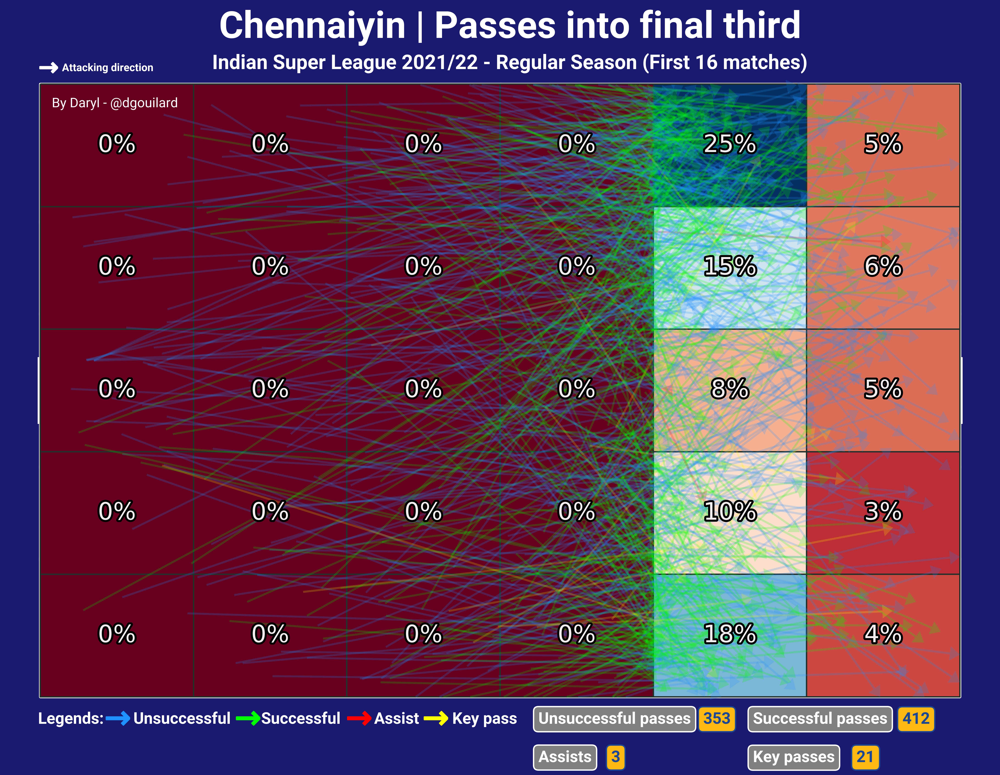

In [38]:
# Set up and draw the pitch
pitch = Pitch(pitch_type = 'statsbomb', pitch_color = 'midnightblue', 
              line_color = "white", stripe = False)
fig, ax = pitch.draw(figsize = (10, 8))

# Empty variables to store the total count of each pass type
successful_passes = 0
unsuccessful_passes = 0
assists = 0
key_passes = 0

# Two empty arrays to store the x and y end coordinates
x_passesFinalThird_coordinates = []
y_passesFinalThird_coordinates = []

# Loop through all passes in pass_events
for i in range(len(pass_events)):

    # If pass_end_location is different than 0
    # (aka pass has an end location)
    if (pass_events['pass_end_location'][i] != 0):
        
        # If the x coordinate of the end location of the pass is equal or larger than 80
        # (aka pass is inside the final third)
        # then execute the steps below
        if (pass_events['location'][i][0] < 80) & (pass_events['pass_end_location'][i][0] >= 80):
            # Loop through goalkeeper_passes df to get all coordinates
            x_passesFinalThird_coordinates.append(pass_events['pass_end_location'][i][0])
            y_passesFinalThird_coordinates.append(pass_events['pass_end_location'][i][1])

# Path effects for zone maps
path_eff = [path_effects.Stroke(linewidth=3, foreground='black'),
            path_effects.Normal()]

# Heatmap and labels for zone maps
bin_statistic = pitch.bin_statistic(x_passesFinalThird_coordinates, y_passesFinalThird_coordinates, statistic = 'count',
                                    bins = (6, 5), normalize = True)
pitch.heatmap(bin_statistic, ax = ax,
                cmap = 'RdBu', edgecolors = '#22312b')
labels = pitch.label_heatmap(bin_statistic, color = '#f4edf0', fontsize = 18,
                             ax = ax, ha = 'center', va = 'center',
                             str_format = '{:.0%}', path_effects = path_eff)

# Loop through all passes in pass_events
for i in range(len(pass_events)):
    
    # If pass_end_location is different than 0
    # (aka pass has an end location)
    if (pass_events['pass_end_location'][i] != 0):
        
        # If the x coordinate of the end location of the pass is equal or larger than 80
        # (aka pass is inside the final third)
        # then execute the steps below
        if (pass_events['location'][i][0] < 80) & (pass_events['pass_end_location'][i][0] >= 80):

            # If pass_outcome does not contain any specific value
            # (aka pass is successful)
            if (pass_events['pass_outcome'][i] == 0):
                
                # If goal_assist is set to True
                # (aka pass assists a goal)
                if (pass_events['pass_goal_assist'][i] == True):
                    # Plot the pass
                    arrow = pitch.arrows(pass_events['location'][i][0], pass_events['location'][i][1], 
                                            pass_events['pass_end_location'][i][0], pass_events['pass_end_location'][i][1], 
                                            width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'red', alpha = 0.2, ax = ax)
                    assists = assists + 1 # Increment the assist count up by 1
                    successful_passes = successful_passes + 1 # Increment the successful pass count up by 1
                
                # If shot_assist is set to True
                # (aka pass assists a shot)
                elif (pass_events['pass_shot_assist'][i] == True):
                    # Plot the pass
                    arrow = pitch.arrows(pass_events['location'][i][0], pass_events['location'][i][1], 
                                            pass_events['pass_end_location'][i][0], pass_events['pass_end_location'][i][1], 
                                            width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'yellow', alpha = 0.2, ax = ax)
                    key_passes = key_passes + 1 # Increment the key pass count up by 1
                    successful_passes = successful_passes + 1 # Increment the successful pass count up by 1
                
                # If neither conditions above are true
                # (aka pass does not assist a goal nor a shot)
                else:
                    # Plot the pass
                    arrow = pitch.arrows(pass_events['location'][i][0], pass_events['location'][i][1], 
                                            pass_events['pass_end_location'][i][0], pass_events['pass_end_location'][i][1], 
                                            width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'lime', alpha = 0.2, ax = ax)
                    successful_passes = successful_passes + 1 # Increment the successful pass count up by 1
            
            # If pass_outcome contains a specific value
            # (aka pass is unsuccessful/out/called offside)
            else:
                arrow = pitch.arrows(pass_events['location'][i][0], pass_events['location'][i][1], 
                                        pass_events['pass_end_location'][i][0], pass_events['pass_end_location'][i][1], 
                                        width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'dodgerblue', alpha = 0.2, ax = ax)
                unsuccessful_passes = unsuccessful_passes + 1 # Increment the unsuccessful pass count up by 1

# Plot the legends for each type of pass
ax.text(4, 83.5, 'Legends:', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(10, 83, s = 350, marker = "$→$",
            color = "dodgerblue", edgecolors = "dodgerblue")
ax.text(18.5, 83.5, 'Unsuccessful', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(27, 83, s = 350, marker = "$→$",
            color = "lime", edgecolors = "lime")
ax.text(34, 83.5, 'Successful', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(41.5, 83, s = 350, marker = "$→$",
            color = "red", edgecolors = "red")
ax.text(46.5, 83.5, 'Assist', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(51.5, 83, s = 350, marker = "$→$",
            color = "yellow", edgecolors = "yellow")
ax.text(58, 83.5, 'Key pass', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')

# Plot the attacking direction arrow
ax.scatter(1, -2, s = 200, marker = "$→$",
            color = "white", edgecolors = "white")
ax.text(8.8, -1.7, 'Attacking direction', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 8, ha = 'center')

# Set title, subtitle, and endnote
plt.suptitle(x = 0.51, y = 0.87, t = "Chennaiyin | Passes into final third", color = 'white', fontfamily = 'roboto', 
                fontweight = 'bold', fontsize = 28, ha = 'center')
ax.set_title(x = 0.51, y = 0.965, label = 'Indian Super League 2021/22' + " - " + 'Regular Season (First 16 matches)', 
        color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 15, ha = 'center')
ax.text(1.5, 3, "By Daryl - @dgouilard", color = 'white', fontfamily = 'roboto', fontsize = 10)

# Set up text boxes and font dict
text_box = dict(boxstyle = 'round', facecolor = 'grey', edgecolor = 'white')
home_values = dict(boxstyle='round', facecolor = home_colour,
                     edgecolor = home_edge_colour)

# Display the total count for each type of passes
ax.text(65, 83.5, 'Unsuccessful passes', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = text_box)
ax.text(86.5, 83.5, str(unsuccessful_passes), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(93, 83.5, 'Successful passes', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = text_box)
ax.text(112.5, 83.5, str(successful_passes), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(65, 88.5, 'Assists', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = text_box)
ax.text(74.5, 88.5, str(assists), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(93, 88.5, 'Key passes', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = text_box)
ax.text(106.5, 88.5, str(key_passes), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

# Set the facecolor, width, and height for fig
fig.set_facecolor('midnightblue')
fig.set_figwidth(10.5)
fig.set_figheight(10)

Corner deliveries

In [24]:
# Get all corner passes
corner_passes = pass_events.loc[(pass_events['pass_type'] == 'Corner')].reset_index(drop = True)
corner_passes

,50_50,bad_behaviour_card,ball_receipt_outcome,ball_recovery_offensive,ball_recovery_recovery_failure,block_deflection,block_offensive,block_save_block,carry_end_location,clearance_aerial_won,...,shot_statsbomb_xg,shot_technique,shot_type,substitution_outcome,substitution_replacement,tactics,team,timestamp,type,under_pressure
0,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,0,0,0,Chennaiyin,00:30:41.711,Pass,0
1,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,0,0,0,Chennaiyin,00:10:36.554,Pass,0
2,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,0,0,0,Chennaiyin,00:22:59.487,Pass,0
3,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,0,0,0,Chennaiyin,00:03:48.880,Pass,0
4,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,0,0,0,Chennaiyin,00:18:00.631,Pass,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,0,0,0,Chennaiyin,00:02:32.573,Pass,0
66,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,0,0,0,Chennaiyin,00:04:51.840,Pass,0
67,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,0,0,0,Chennaiyin,00:12:22.288,Pass,0
68,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,0,0,0,Chennaiyin,00:21:29.480,Pass,0


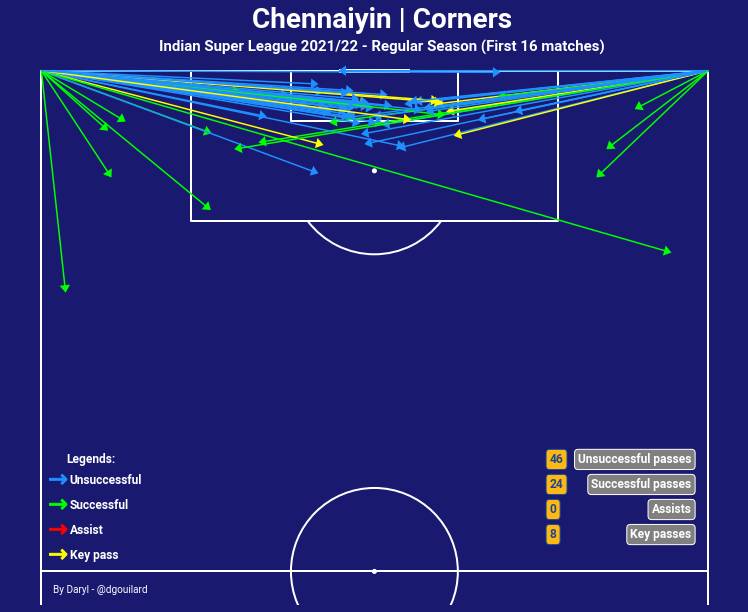

In [25]:
# Set up and draw the pitch
pitch = VerticalPitch(pitch_type = 'statsbomb', pitch_color = 'midnightblue', 
              line_color = "white", stripe = False, half = True)
fig, ax = pitch.draw(figsize = (10, 8))

# Empty variables to store the total count of each pass type
successful_passes = 0
unsuccessful_passes = 0
assists = 0
key_passes = 0

# Loop through all passes in corner_passes
for i in range(len(corner_passes)):

    # If pass_outcome does not contain any specific value
    # (aka pass is successful)
    if (corner_passes['pass_outcome'][i] == 0):
        
        # If goal_assist is set to True
        # (aka pass assists a goal)
        if (corner_passes['pass_goal_assist'][i] == True):
            # Plot the pass
            arrow = pitch.arrows(corner_passes['location'][i][0], corner_passes['location'][i][1], 
                                    corner_passes['pass_end_location'][i][0], corner_passes['pass_end_location'][i][1], 
                                    width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'red', alpha = 1, ax = ax)
            assists = assists + 1 # Increment the assist count up by 1
            successful_passes = successful_passes + 1 # Increment the successful pass count up by 1
        
        # If shot_assist is set to True
        # (aka pass assists a shot)
        elif (corner_passes['pass_shot_assist'][i] == True):
            # Plot the pass
            arrow = pitch.arrows(corner_passes['location'][i][0], corner_passes['location'][i][1], 
                                    corner_passes['pass_end_location'][i][0], corner_passes['pass_end_location'][i][1], 
                                    width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'yellow', alpha = 1, ax = ax)
            key_passes = key_passes + 1 # Increment the key pass count up by 1
            successful_passes = successful_passes + 1 # Increment the successful pass count up by 1
        
        # If neither conditions above are true
        # (aka pass does not assist a goal nor a shot)
        else:
            # Plot the pass
            arrow = pitch.arrows(corner_passes['location'][i][0], corner_passes['location'][i][1], 
                                    corner_passes['pass_end_location'][i][0], corner_passes['pass_end_location'][i][1], 
                                    width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'lime', alpha = 1, ax = ax)
            successful_passes = successful_passes + 1 # Increment the successful pass count up by 1
    
    # If pass_outcome contains a specific value
    # (aka pass is unsuccessful/out/called offside)
    else:
        arrow = pitch.arrows(corner_passes['location'][i][0], corner_passes['location'][i][1], 
                                corner_passes['pass_end_location'][i][0], corner_passes['pass_end_location'][i][1], 
                                width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'dodgerblue', alpha = 1, ax = ax)
        unsuccessful_passes = unsuccessful_passes + 1 # Increment the unsuccessful pass count up by 1

# Plot the legends for each type of pass
ax.text(6, 73, 'Legends:', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(2, 71, s = 350, marker = "$→$",
            color = "dodgerblue", edgecolors = "dodgerblue")
ax.text(3.5, 70.5, 'Unsuccessful', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'left')
ax.scatter(2, 68, s = 350, marker = "$→$",
            color = "lime", edgecolors = "lime")
ax.text(3.5, 67.5, 'Successful', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'left')
ax.scatter(2, 65, s = 350, marker = "$→$",
            color = "red", edgecolors = "red")
ax.text(3.5, 64.5, 'Assist', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'left')
ax.scatter(2, 62, s = 350, marker = "$→$",
            color = "yellow", edgecolors = "yellow")
ax.text(3.5, 61.5, 'Key pass', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'left')

# Set title, subtitle, and endnote
plt.suptitle(x = 0.51, y = 0.91, t = "Chennaiyin | Corners", color = 'white', fontfamily = 'roboto', 
                fontweight = 'bold', fontsize = 28, ha = 'center')
ax.set_title(x = 0.51, y = 0.965, label = 'Indian Super League 2021/22' + " - " + 'Regular Season (First 16 matches)', 
        color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 15, ha = 'center')
ax.text(1.5, 57.5, "By Daryl - @dgouilard", color = 'white', fontfamily = 'roboto', fontsize = 10)

# Set up text boxes and font dict
text_box = dict(boxstyle = 'round', facecolor = 'grey', edgecolor = 'white')
home_values = dict(boxstyle='round', facecolor = home_colour,
                     edgecolor = home_edge_colour)

# Display the total count for each type of passes
ax.text(78, 73, 'Unsuccessful passes', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'right', bbox  = text_box)
ax.text(61, 73, str(unsuccessful_passes), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(78, 70, 'Successful passes', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'right', bbox  = text_box)
ax.text(61, 70, str(successful_passes), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(78, 67, 'Assists', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'right', bbox  = text_box)
ax.text(61, 67, str(assists), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(78, 64, 'Key passes', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'right', bbox  = text_box)
ax.text(61, 64, str(key_passes), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

# Set the facecolor, width, and height for fig
fig.set_facecolor('midnightblue')
fig.set_figwidth(10.5)
fig.set_figheight(10)

Anirudh Thapa & Ariel Borysiuk's pass maps

In [26]:
# Get all passes of Anirudh Thapa and Ariel Borysiuk from pass_events df
thapa_passes = pass_events.loc[(pass_events['player'] == 'Anirudh Thapa')].reset_index(drop = True)
borysiuk_passes = pass_events.loc[(pass_events['player'] == 'Ariel Borysiuk')].reset_index(drop = True)

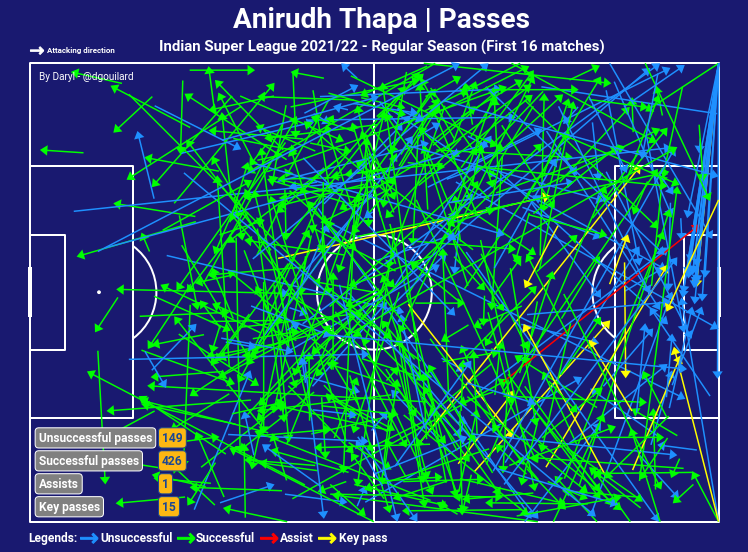

In [27]:
# Set up and draw the pitch
pitch = Pitch(pitch_type = 'statsbomb', pitch_color = 'midnightblue', 
              line_color = "white", stripe = False)
fig, ax = pitch.draw(figsize = (10, 8))

# Empty variables to store the total count of each pass type
successful_passes = 0
unsuccessful_passes = 0
assists = 0
key_passes = 0

# Loop through all passes in thapa_passes
for i in range(len(thapa_passes)):

    # If pass_outcome does not contain any specific value
    # (aka pass is successful)
    if (thapa_passes['pass_outcome'][i] == 0):
        
        # If goal_assist is set to True
        # (aka pass assists a goal)
        if (thapa_passes['pass_goal_assist'][i] == True):
            # Plot the pass
            arrow = pitch.arrows(thapa_passes['location'][i][0], thapa_passes['location'][i][1], 
                                    thapa_passes['pass_end_location'][i][0], thapa_passes['pass_end_location'][i][1], 
                                    width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'red', alpha = 1, ax = ax)
            assists = assists + 1 # Increment the assist count up by 1
            successful_passes = successful_passes + 1 # Increment the successful pass count up by 1
        
        # If shot_assist is set to True
        # (aka pass assists a shot)
        elif (thapa_passes['pass_shot_assist'][i] == True):
            # Plot the pass
            arrow = pitch.arrows(thapa_passes['location'][i][0], thapa_passes['location'][i][1], 
                                    thapa_passes['pass_end_location'][i][0], thapa_passes['pass_end_location'][i][1], 
                                    width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'yellow', alpha = 1, ax = ax)
            key_passes = key_passes + 1 # Increment the key pass count up by 1
            successful_passes = successful_passes + 1 # Increment the successful pass count up by 1
        
        # If neither conditions above are true
        # (aka pass does not assist a goal nor a shot)
        else:
            # Plot the pass
            arrow = pitch.arrows(thapa_passes['location'][i][0], thapa_passes['location'][i][1], 
                                    thapa_passes['pass_end_location'][i][0], thapa_passes['pass_end_location'][i][1], 
                                    width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'lime', alpha = 1, ax = ax)
            successful_passes = successful_passes + 1 # Increment the successful pass count up by 1
    
    # If pass_outcome contains a specific value
    # (aka pass is unsuccessful/out/called offside)
    else:
        arrow = pitch.arrows(thapa_passes['location'][i][0], thapa_passes['location'][i][1], 
                                thapa_passes['pass_end_location'][i][0], thapa_passes['pass_end_location'][i][1], 
                                width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'dodgerblue', alpha = 1, ax = ax)
        unsuccessful_passes = unsuccessful_passes + 1 # Increment the unsuccessful pass count up by 1

# Plot the legends for each type of pass
ax.text(4, 83.5, 'Legends:', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(10, 83, s = 350, marker = "$→$",
            color = "dodgerblue", edgecolors = "dodgerblue")
ax.text(18.5, 83.5, 'Unsuccessful', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(27, 83, s = 350, marker = "$→$",
            color = "lime", edgecolors = "lime")
ax.text(34, 83.5, 'Successful', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(41.5, 83, s = 350, marker = "$→$",
            color = "red", edgecolors = "red")
ax.text(46.5, 83.5, 'Assist', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(51.5, 83, s = 350, marker = "$→$",
            color = "yellow", edgecolors = "yellow")
ax.text(58, 83.5, 'Key pass', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')

# Plot the attacking direction arrow
ax.scatter(1, -2, s = 200, marker = "$→$",
            color = "white", edgecolors = "white")
ax.text(8.8, -1.7, 'Attacking direction', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 8, ha = 'center')

# Set title, subtitle, and endnote
plt.suptitle(x = 0.51, y = 0.87, t = "Anirudh Thapa | Passes", color = 'white', fontfamily = 'roboto', 
                fontweight = 'bold', fontsize = 28, ha = 'center')
ax.set_title(x = 0.51, y = 0.965, label = 'Indian Super League 2021/22' + " - " + 'Regular Season (First 16 matches)', 
        color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 15, ha = 'center')
ax.text(1.5, 3, "By Daryl - @dgouilard", color = 'white', fontfamily = 'roboto', fontsize = 10)

# Set up text boxes and font dict
text_box = dict(boxstyle = 'round', facecolor = 'grey', edgecolor = 'white')
home_values = dict(boxstyle='round', facecolor = home_colour,
                     edgecolor = home_edge_colour)

# Display the total count for each type of passes
ax.text(1.5, 66, 'Unsuccessful passes', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = text_box)
ax.text(23, 66, str(unsuccessful_passes), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(1.5, 70, 'Successful passes', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = text_box)
ax.text(23, 70, str(successful_passes), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(1.5, 74, 'Assists', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = text_box)
ax.text(23, 74, str(assists), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(1.5, 78, 'Key passes', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = text_box)
ax.text(23, 78, str(key_passes), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

# Set the facecolor, width, and height for fig
fig.set_facecolor('midnightblue')
fig.set_figwidth(10.5)
fig.set_figheight(10)

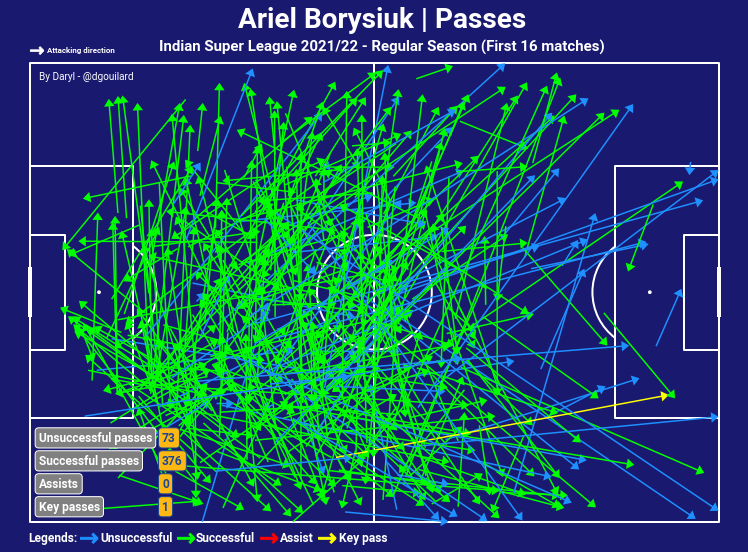

In [28]:
# Set up and draw the pitch
pitch = Pitch(pitch_type = 'statsbomb', pitch_color = 'midnightblue', 
              line_color = "white", stripe = False)
fig, ax = pitch.draw(figsize = (10, 8))

# Empty variables to store the total count of each pass type
successful_passes = 0
unsuccessful_passes = 0
assists = 0
key_passes = 0

# Loop through all passes in borysiuk_passes
for i in range(len(borysiuk_passes)):

    # If pass_outcome does not contain any specific value
    # (aka pass is successful)
    if (borysiuk_passes['pass_outcome'][i] == 0):
        
        # If goal_assist is set to True
        # (aka pass assists a goal)
        if (borysiuk_passes['pass_goal_assist'][i] == True):
            # Plot the pass
            arrow = pitch.arrows(borysiuk_passes['location'][i][0], borysiuk_passes['location'][i][1], 
                                    borysiuk_passes['pass_end_location'][i][0], borysiuk_passes['pass_end_location'][i][1], 
                                    width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'red', alpha = 1, ax = ax)
            assists = assists + 1 # Increment the assist count up by 1
            successful_passes = successful_passes + 1 # Increment the successful pass count up by 1
        
        # If shot_assist is set to True
        # (aka pass assists a shot)
        elif (borysiuk_passes['pass_shot_assist'][i] == True):
            # Plot the pass
            arrow = pitch.arrows(borysiuk_passes['location'][i][0], borysiuk_passes['location'][i][1], 
                                    borysiuk_passes['pass_end_location'][i][0], borysiuk_passes['pass_end_location'][i][1], 
                                    width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'yellow', alpha = 1, ax = ax)
            key_passes = key_passes + 1 # Increment the key pass count up by 1
            successful_passes = successful_passes + 1 # Increment the successful pass count up by 1
        
        # If neither conditions above are true
        # (aka pass does not assist a goal nor a shot)
        else:
            # Plot the pass
            arrow = pitch.arrows(borysiuk_passes['location'][i][0], borysiuk_passes['location'][i][1], 
                                    borysiuk_passes['pass_end_location'][i][0], borysiuk_passes['pass_end_location'][i][1], 
                                    width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'lime', alpha = 1, ax = ax)
            successful_passes = successful_passes + 1 # Increment the successful pass count up by 1
    
    # If pass_outcome contains a specific value
    # (aka pass is unsuccessful/out/called offside)
    else:
        arrow = pitch.arrows(borysiuk_passes['location'][i][0], borysiuk_passes['location'][i][1], 
                                borysiuk_passes['pass_end_location'][i][0], borysiuk_passes['pass_end_location'][i][1], 
                                width = 1.5, headwidth = 7, headaxislength = 5, headlength = 5, color = 'dodgerblue', alpha = 1, ax = ax)
        unsuccessful_passes = unsuccessful_passes + 1 # Increment the unsuccessful pass count up by 1

# Plot the legends for each type of pass
ax.text(4, 83.5, 'Legends:', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(10, 83, s = 350, marker = "$→$",
            color = "dodgerblue", edgecolors = "dodgerblue")
ax.text(18.5, 83.5, 'Unsuccessful', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(27, 83, s = 350, marker = "$→$",
            color = "lime", edgecolors = "lime")
ax.text(34, 83.5, 'Successful', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(41.5, 83, s = 350, marker = "$→$",
            color = "red", edgecolors = "red")
ax.text(46.5, 83.5, 'Assist', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(51.5, 83, s = 350, marker = "$→$",
            color = "yellow", edgecolors = "yellow")
ax.text(58, 83.5, 'Key pass', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')

# Plot the attacking direction arrow
ax.scatter(1, -2, s = 200, marker = "$→$",
            color = "white", edgecolors = "white")
ax.text(8.8, -1.7, 'Attacking direction', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 8, ha = 'center')

# Set title, subtitle, and endnote
plt.suptitle(x = 0.51, y = 0.87, t = "Ariel Borysiuk | Passes", color = 'white', fontfamily = 'roboto', 
                fontweight = 'bold', fontsize = 28, ha = 'center')
ax.set_title(x = 0.51, y = 0.965, label = 'Indian Super League 2021/22' + " - " + 'Regular Season (First 16 matches)', 
        color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 15, ha = 'center')
ax.text(1.5, 3, "By Daryl - @dgouilard", color = 'white', fontfamily = 'roboto', fontsize = 10)

# Set up text boxes and font dict
text_box = dict(boxstyle = 'round', facecolor = 'grey', edgecolor = 'white')
home_values = dict(boxstyle='round', facecolor = home_colour,
                     edgecolor = home_edge_colour)

# Display the total count for each type of passes
ax.text(1.5, 66, 'Unsuccessful passes', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = text_box)
ax.text(23, 66, str(unsuccessful_passes), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(1.5, 70, 'Successful passes', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = text_box)
ax.text(23, 70, str(successful_passes), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(1.5, 74, 'Assists', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = text_box)
ax.text(23, 74, str(assists), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(1.5, 78, 'Key passes', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = text_box)
ax.text(23, 78, str(key_passes), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

# Set the facecolor, width, and height for fig
fig.set_facecolor('midnightblue')
fig.set_figwidth(10.5)
fig.set_figheight(10)

Łukasz Gikiewicz/Mirlan Murzaev touch maps

In [29]:
# Gather all touch events
touch_events = chennaiyin_events.loc[( (chennaiyin_events['type'] != 'Offside') & (chennaiyin_events['type'] != 'Goal Keeper') )].reset_index(drop = True)

# Filter out touch events for Gikiewicz and Murzaev
gikiewicz_touches = touch_events.loc[(touch_events['player'] == 'Łukasz Gikiewicz')].reset_index(drop = True)
murzaev_touches = touch_events.loc[(touch_events['player'] == 'Mirlan Murzaev')].reset_index(drop = True)

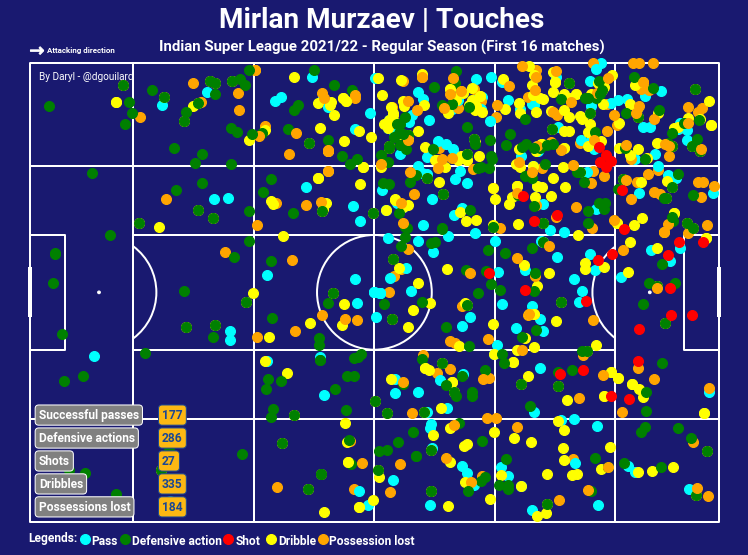

In [30]:
# Set up and draw the pitch
pitch = Pitch(positional = True, positional_color = 'white', pitch_type = 'statsbomb', pitch_color = 'midnightblue', 
              line_color = "white", stripe = False)
fig, ax = pitch.draw(figsize = (10, 8))

# Empty variables to store the total count of each touch type
successful_passes = 0
def_actions = 0
shots = 0
dribbles = 0
poss_lost = 0

# Loop through all passes in murzaev_touches
for i in range(len(murzaev_touches)):
    
    # If condition for pass events
    if (murzaev_touches['type'][i] == 'Pass'):
        if (murzaev_touches['pass_outcome'][i] == 'Incomplete') | (murzaev_touches['pass_outcome'][i] == 'Out') | (murzaev_touches['pass_outcome'][i] == 'Pass Offside'):
            nodes = pitch.scatter(murzaev_touches['location'][i][0], murzaev_touches['location'][i][1], s = 100, marker = 'o',
                                    color = "orange", edgecolors = "orange", zorder = 1, ax = ax)
            poss_lost += 1
        elif (murzaev_touches['pass_outcome'][i] == 0):
            nodes = pitch.scatter(murzaev_touches['location'][i][0], murzaev_touches['location'][i][1], s = 100, marker = 'o',
                                    color = "cyan", edgecolors = "cyan", zorder = 1, ax = ax)
            successful_passes += 1
    
    # If condition for defensive action events
    if (murzaev_touches['type'][i] == 'Ball Recovery') | (murzaev_touches['type'][i] == 'Duel') | (murzaev_touches['type'][i] == '50/50') | \
         (murzaev_touches['type'][i] == 'Clearance') | (murzaev_touches['type'][i] == 'Interception') | (murzaev_touches['type'][i] == 'Block') | \
            (murzaev_touches['type'][i] == 'Pressure') | (murzaev_touches['type'][i] == 'Foul Committed') | (murzaev_touches['type'][i] == 'Shield'):
        nodes = pitch.scatter(murzaev_touches['location'][i][0], murzaev_touches['location'][i][1], s = 100, marker = 'o',
                                color = "green", edgecolors = "green", zorder = 1, ax = ax)
        def_actions += 1
    
    # If condition for shot events
    if (murzaev_touches['type'][i] == 'Shot'):
        nodes = pitch.scatter(murzaev_touches['location'][i][0], murzaev_touches['location'][i][1], s = 100, marker = 'o',
                                color = "red", edgecolors = "red", zorder = 1, ax = ax)
        shots += 1
    
    # If condition for dribble/carry events
    if (murzaev_touches['type'][i] == 'Dribble') | (murzaev_touches['type'][i] == 'Carry'):
        if (murzaev_touches['dribble_overrun'][i] == True) | (murzaev_touches['dribble_outcome'][i] == 'Incomplete'):
            nodes = pitch.scatter(murzaev_touches['location'][i][0], murzaev_touches['location'][i][1], s = 100, marker = 'o',
                                    color = "orange", edgecolors = "orange", zorder = 1, ax = ax)
            poss_lost += 1
        else:
            nodes = pitch.scatter(murzaev_touches['location'][i][0], murzaev_touches['location'][i][1], s = 100, marker = 'o',
                                    color = "yellow", edgecolors = "yellow", zorder = 1, ax = ax)
            dribbles += 1
    
    # If condition for possession lost events
    if (murzaev_touches['type'][i] == 'Dispossessed') | (murzaev_touches['type'][i] == 'Miscontrol') | (murzaev_touches['type'][i] == 'Error'):
        nodes = pitch.scatter(murzaev_touches['location'][i][0], murzaev_touches['location'][i][1], s = 100, marker = 'o',
                                color = "orange", edgecolors = "orange", zorder = 1, ax = ax)
        poss_lost += 1

# Plot the legends for each type of touch
ax.text(4, 83.5, 'Legends:', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(9.5, 83, s = 100, marker = "o",
            color = "cyan", edgecolors = "cyan")
ax.text(13, 84, 'Pass', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(16.5, 83, s = 100, marker = "o",
            color = "green", edgecolors = "green")
ax.text(25.5, 84, 'Defensive action', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(34.5, 83, s = 100, marker = "o",
            color = "red", edgecolors = "red")
ax.text(38, 84, 'Shot', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(42, 83, s = 100, marker = "o",
            color = "yellow", edgecolors = "yellow")
ax.text(46.5, 84, 'Dribble', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')
ax.scatter(51, 83, s = 100, marker = "o",
            color = "orange", edgecolors = "orange")
ax.text(59.5, 84, 'Possession lost', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 12, ha = 'center')

# Plot the attacking direction arrow
ax.scatter(1, -2, s = 200, marker = "$→$",
            color = "white", edgecolors = "white")
ax.text(8.8, -1.7, 'Attacking direction', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 8, ha = 'center')

# Set title, subtitle, and endnote
plt.suptitle(x = 0.51, y = 0.87, t = "Mirlan Murzaev | Touches", color = 'white', fontfamily = 'roboto', 
                fontweight = 'bold', fontsize = 28, ha = 'center')
ax.set_title(x = 0.51, y = 0.965, label = 'Indian Super League 2021/22' + " - " + 'Regular Season (First 16 matches)', 
        color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 15, ha = 'center')
ax.text(1.5, 3, "By Daryl - @dgouilard", color = 'white', fontfamily = 'roboto', fontsize = 10)

# Set up text boxes and font dict
text_box = dict(boxstyle = 'round', facecolor = 'grey', edgecolor = 'white')
home_values = dict(boxstyle='round', facecolor = home_colour,
                     edgecolor = home_edge_colour)

# Display the total count for each type of passes
ax.text(1.5, 62, 'Successful passes', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = text_box)
ax.text(23, 62, str(successful_passes), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(1.5, 66, 'Defensive actions', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = text_box)
ax.text(23, 66, str(def_actions), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(1.5, 70, 'Shots', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = text_box)
ax.text(23, 70, str(shots), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(1.5, 74, 'Dribbles', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = text_box)
ax.text(23, 74, str(dribbles), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

ax.text(1.5, 78, 'Possessions lost', color = 'white', fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = text_box)
ax.text(23, 78, str(poss_lost), color = home_edge_colour, fontfamily = "roboto", fontweight = "bold", fontsize = 12, ha = 'left', bbox  = home_values)

# Set the facecolor, width, and height for fig
fig.set_facecolor('midnightblue')
fig.set_figwidth(10.5)
fig.set_figheight(10)

Defensive actions zone map

In [31]:
# Get all defensive action events
defActions_events = chennaiyin_events.loc[( (chennaiyin_events['type'] == 'Ball Recovery') | (chennaiyin_events['type'] == 'Duel') | \
    (chennaiyin_events['type'] == '50/50') | (chennaiyin_events['type'] == 'Clearance') | (chennaiyin_events['type'] == 'Interception') | \
        (chennaiyin_events['type'] == 'Block') | (chennaiyin_events['type'] == 'Pressure') | (chennaiyin_events['type'] == 'Foul Committed') \
            )].reset_index(drop = True)

In [32]:
# Two empty arrays to store the x and y end coordinates
x_defActions_coordinates = []
y_defActions_coordinates = []

# Loop through defActions_events df to get all coordinates
for i in range(len(defActions_events)):
    x_defActions_coordinates.append(defActions_events['location'][i][0])
    y_defActions_coordinates.append(defActions_events['location'][i][1])

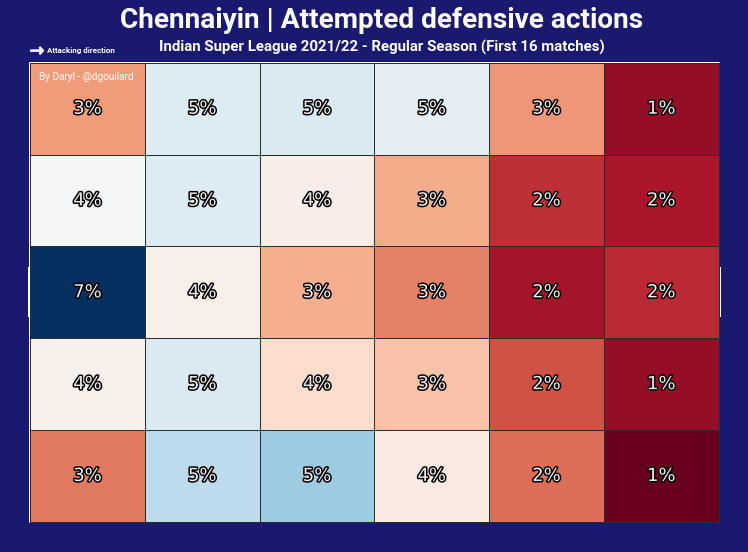

In [33]:
# Set up and draw the pitch
pitch = Pitch(pitch_type = 'statsbomb', pitch_color = 'midnightblue', 
              line_color = "white", stripe = False)
fig, ax = pitch.draw(figsize = (10, 8))

# Path effects for zone maps
path_eff = [path_effects.Stroke(linewidth=3, foreground='black'),
            path_effects.Normal()]

# Heatmap and labels for zone maps
bin_statistic = pitch.bin_statistic(x_defActions_coordinates, y_defActions_coordinates, statistic = 'count',
                                    bins = (6, 5), normalize = True)
pitch.heatmap(bin_statistic, ax = ax,
                cmap = 'RdBu', edgecolors = '#22312b')
labels = pitch.label_heatmap(bin_statistic, color = '#f4edf0', fontsize = 18,
                             ax = ax, ha = 'center', va = 'center',
                             str_format = '{:.0%}', path_effects = path_eff)

# Plot the attacking direction arrow
ax.scatter(1, -2, s = 200, marker = "$→$",
            color = "white", edgecolors = "white")
ax.text(8.8, -1.7, 'Attacking direction', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 8, ha = 'center')

# Set title, subtitle, and endnote
plt.suptitle(x = 0.51, y = 0.87, t = "Chennaiyin | Attempted defensive actions", color = 'white', fontfamily = 'roboto', 
                fontweight = 'bold', fontsize = 28, ha = 'center')
ax.set_title(x = 0.51, y = 0.965, label = 'Indian Super League 2021/22' + " - " + 'Regular Season (First 16 matches)', 
        color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 15, ha = 'center')
ax.text(1.5, 3, "By Daryl - @dgouilard", color = 'white', fontfamily = 'roboto', fontsize = 10)

# Set the facecolor, width, and height for fig
fig.set_facecolor('midnightblue')
fig.set_figwidth(10.5)
fig.set_figheight(10)

Possession won

In [34]:
# Gather all possession won events
# (except for successful 50/50 events because processing that event is kinda complicated!)
possWon_events = chennaiyin_events.loc[( (chennaiyin_events['type'] == 'Ball Recovery') & (chennaiyin_events['ball_recovery_recovery_failure'] != True) ) | \
    ( (chennaiyin_events['type'] == 'Duel') & ( (chennaiyin_events['duel_outcome'] == 'Won') | (chennaiyin_events['duel_outcome'] == 'Success') | (chennaiyin_events['duel_outcome'] == 'Success Out') | (chennaiyin_events['duel_outcome'] == 'Success In Play') ) )| \
            (chennaiyin_events['type'] == 'Clearance') | \
                ( (chennaiyin_events['type'] == 'Interception') & ( (chennaiyin_events['interception_outcome'] == 'Won') | (chennaiyin_events['interception_outcome'] == 'Success') | (chennaiyin_events['interception_outcome'] == 'Success In Play') | (chennaiyin_events['interception_outcome'] == 'Success Out') ) ) | \
        (chennaiyin_events['type'] == 'Block') | (chennaiyin_events['type'] == 'Pressure')].reset_index(drop = True)

In [35]:
# Two empty arrays to store the x and y end coordinates
x_possWon_coordinates = []
y_possWon_coordinates = []

# Loop through possWon_events df to get all coordinates
for i in range(len(possWon_events)):
    x_possWon_coordinates.append(possWon_events['location'][i][0])
    y_possWon_coordinates.append(possWon_events['location'][i][1])

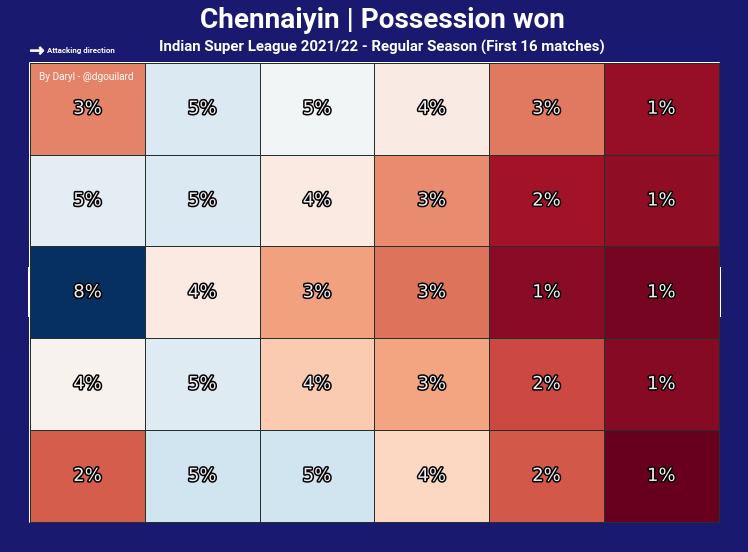

In [36]:
# Set up and draw the pitch
pitch = Pitch(pitch_type = 'statsbomb', pitch_color = 'midnightblue', 
              line_color = "white", stripe = False)
fig, ax = pitch.draw(figsize = (10, 8))

# Path effects for zone maps
path_eff = [path_effects.Stroke(linewidth=3, foreground='black'),
            path_effects.Normal()]

# Heatmap and labels for zone maps
bin_statistic = pitch.bin_statistic(x_possWon_coordinates, y_possWon_coordinates, statistic = 'count',
                                    bins = (6, 5), normalize = True)
pitch.heatmap(bin_statistic, ax = ax,
                cmap = 'RdBu', edgecolors = '#22312b')
labels = pitch.label_heatmap(bin_statistic, color = '#f4edf0', fontsize = 18,
                             ax = ax, ha = 'center', va = 'center',
                             str_format = '{:.0%}', path_effects = path_eff)

# Plot the attacking direction arrow
ax.scatter(1, -2, s = 200, marker = "$→$",
            color = "white", edgecolors = "white")
ax.text(8.8, -1.7, 'Attacking direction', color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 8, ha = 'center')

# Set title, subtitle, and endnote
plt.suptitle(x = 0.51, y = 0.87, t = "Chennaiyin | Possession won", color = 'white', fontfamily = 'roboto', 
                fontweight = 'bold', fontsize = 28, ha = 'center')
ax.set_title(x = 0.51, y = 0.965, label = 'Indian Super League 2021/22' + " - " + 'Regular Season (First 16 matches)', 
        color = 'white', fontfamily = 'roboto', fontweight = 'bold', fontsize = 15, ha = 'center')
ax.text(1.5, 3, "By Daryl - @dgouilard", color = 'white', fontfamily = 'roboto', fontsize = 10)

# Set the facecolor, width, and height for fig
fig.set_facecolor('midnightblue')
fig.set_figwidth(10.5)
fig.set_figheight(10)